In [1]:
# import libraries
import os
import sys
import time
import copy

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from torchsummary import summary

In [2]:
# select GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = "cpu"  # explicitly set to execute on CPU

In [3]:
# transformation of the training/testing images
transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# train/test images' directory
train_path = os.path.join("Dataset", "seg_train")
test_path  = os.path.join("Dataset", "seg_test")

# load the training/testing images
train_set  = ImageFolder(train_path, transform = transform)
test_set   = ImageFolder(test_path, transform = transform)

# create DataLoader
batch_size  = 128
train_loader = DataLoader(train_set, batch_size = batch_size, shuffle = True)
test_loader  = DataLoader(test_set, batch_size = batch_size, shuffle = True)

In [4]:
images, labels = next(iter(train_loader))

print("Data shapes (train/test):")
print(images.data.shape, "\n")

print("Data value range:")
print( (torch.min(images.data), torch.max(images.data), torch.mean(images.data)), "\n" )

Data shapes (train/test):
torch.Size([128, 3, 224, 224]) 

Data value range:
(tensor(-2.1179), tensor(2.6400), tensor(-0.0574)) 



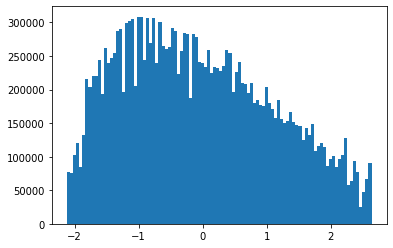

In [5]:
# histogram of the data
plt.hist(images.data.numpy().flatten(), bins=100)
plt.show()

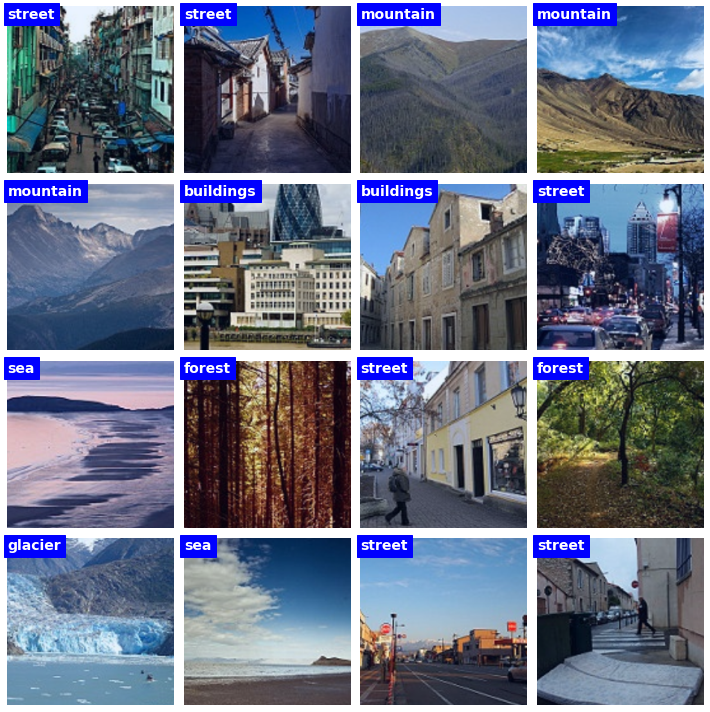

In [6]:
# inspect a few random images
fig, axs = plt.subplots(4, 4, figsize = (10, 10))

for (i, ax) in enumerate(axs.flatten()):
    # extract that images (need to transpose it back to 32 x 32 x 3)
    pic = images.data[i].numpy().transpose((1, 2, 0))
    pic = pic - np.min(pic) # undo normalization
    pic = pic/np.max(pic)
    
    # and its label
    label = train_set.classes[labels[i]]
    
    # and show these
    ax.imshow(pic)
    ax.text(0, 0, label, ha="left", va="top", fontsize=14, fontweight="bold", color="w", backgroundcolor="b")
    ax.axis("off")
    
plt.tight_layout()
plt.show()

In [7]:
# import vgg-16 model
vgg_network = torchvision.models.vgg16(pretrained = True)

In [8]:
# let's inspect the network
vgg_network

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [9]:
summary(vgg_network.to(device), (3, 224, 224));

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [10]:
# freeze all the layers (final layer will change later)
for p in vgg_network.parameters():
    p.requires_grad = False

In [11]:
# change the final layer
vgg_network.classifier[6] = nn.Linear(vgg_network.classifier[6].in_features, 6)

# push the model to GPU
vgg_network.to(device)

# now, summary of the vgg model (check the trainable parameters)
summary(vgg_network, (3, 224, 224));

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [12]:
# now training time
loss_func = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(vgg_network.parameters(), lr = 0.001)

In [13]:
# create a function to train the model
def train_the_model(network, loss_fun, optimizer, epochs = 100):
    # number of epochs
    epochs = epochs
    
    # send the model to GPU'
    network.to(device)
    
    # initialize losses
    train_loss     = torch.zeros(epochs)
    test_loss      = torch.zeros(epochs)
    train_accuracy = []
    test_accuracy  = []
    
    # initialize a dictionary to save the best model
    the_best_model = {"Accuracy": 0, "network": None}
    
    # loop over epochs
    for epoch in range(epochs):
        # To calcuate the execution time,
        start_time = time.time()
        
        # switch on the training mode
        network.train()
        
        batch_accuracy = []
        batch_loss     = []
        # loop over the training data batches
        for X, y in train_loader:
            # push X and y to GPU
            X = X.to(device)
            y = y.to(device)
            
            # forward propagation
            yHat = network(X)
            
            # compute loss
            loss = loss_fun(yHat, y)
            
            # backward propagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            # store the loss from this batch
            batch_loss.append(loss.item())
            
            # compute accuracy
            accuracy_percentage = accuracy_score(y.detach().cpu(), torch.argmax(yHat, axis=1).detach().cpu()) * 100
            batch_accuracy.append( accuracy_percentage )
        # end of batch loop
        
        # now that we've trained through the batches, get their average train accuracy
        train_acc = np.mean(batch_accuracy)
        train_accuracy.append( train_acc ) 
        
        # and get average losses across the batches
        train_loss[epoch] = np.mean( batch_loss )
        
        # switch to evaluation mode to calculate test accuracy
        network.eval()
        
        # calculate the test loss
        temp_test_loss = []  # to store loss temporarily
        temp_test_acc  = []  # to store accuracy temporarily
        # loop through the test batches
        for X, y in test_loader:      
            # push the data to GPU
            X = X.to(device)
            y = y.to(device)
        
            with torch.no_grad():  # deactivate autograd
                # calculate prediction
                yHat = network(X)
                # calculate loss
                loss = loss_fun(yHat, y)
                # and store it
                temp_test_loss.append(loss.item())
                
                # calculate accuracy and store it
                accuracy_percentage = accuracy_score(y.detach().cpu(), torch.argmax(yHat, axis=1).detach().cpu()) * 100
                temp_test_acc.append( accuracy_percentage )
        
        # calculate overall test loss and store it
        test_loss[epoch] = np.mean(temp_test_loss)
            
        # calculate the test accuracy (average of all the batches)
        test_acc = np.mean(temp_test_acc)
        test_accuracy.append(test_acc)
        

        # save the best model
        if test_acc > the_best_model["Accuracy"]:
            # new best accuracy
            the_best_model["Accuracy"] = test_acc
            # model's internal state
            the_best_model["network"] = copy.deepcopy( network.state_dict() )
        
        # calculate end time
        end_time = time.time()
        
        # display a status message
        msg = f"Completed: {epoch + 1}/{epochs} - took: {(end_time - start_time):.6f} sec - Train accuracy: {train_acc:.5f} - Test accuracy: {test_acc:.5f}"
        sys.stdout.write("\n" + msg)
        
        
    # end epochs
    
    # function output
    return train_loss, test_loss, train_accuracy, test_accuracy, network, the_best_model

In [14]:
%%time

# on GPU (medium powerful), will take ~29 minutes for 10 epochs
# for batch_size = 256, I got error CUDA out of memory

# train the model
train_loss, test_loss, train_accuracy, test_accuracy, network, the_best_model = train_the_model(vgg_network, loss_func, optimizer, epochs = 10)


Completed: 1/10 - took: 177.656747 sec - Train accuracy: 87.48857 - Test accuracy: 91.58296
Completed: 2/10 - took: 174.166755 sec - Train accuracy: 90.71837 - Test accuracy: 92.08984
Completed: 3/10 - took: 174.109968 sec - Train accuracy: 90.87722 - Test accuracy: 91.81548
Completed: 4/10 - took: 172.500932 sec - Train accuracy: 91.04681 - Test accuracy: 92.23865
Completed: 5/10 - took: 173.760248 sec - Train accuracy: 91.31219 - Test accuracy: 92.14565
Completed: 6/10 - took: 171.473686 sec - Train accuracy: 91.56215 - Test accuracy: 92.00149
Completed: 7/10 - took: 171.467292 sec - Train accuracy: 91.56302 - Test accuracy: 92.08984
Completed: 8/10 - took: 171.502295 sec - Train accuracy: 91.72724 - Test accuracy: 91.95964
Completed: 9/10 - took: 171.536496 sec - Train accuracy: 91.75253 - Test accuracy: 92.36886
Completed: 10/10 - took: 174.353469 sec - Train accuracy: 92.06468 - Test accuracy: 92.00614CPU times: total: 1h 11min 43s
Wall time: 28min 52s


In [15]:
# now, we got the best model from our training time. Save it as a file
torch.save(the_best_model["network"], f"best_vgg_checkpoint_acc{the_best_model['Accuracy']}.pt")

# if you want to load the pretrained model, then use the below code
# directory = "./" 
# torch.hub.load(directory, model = "model.pt", source = "local", pretrained=True)

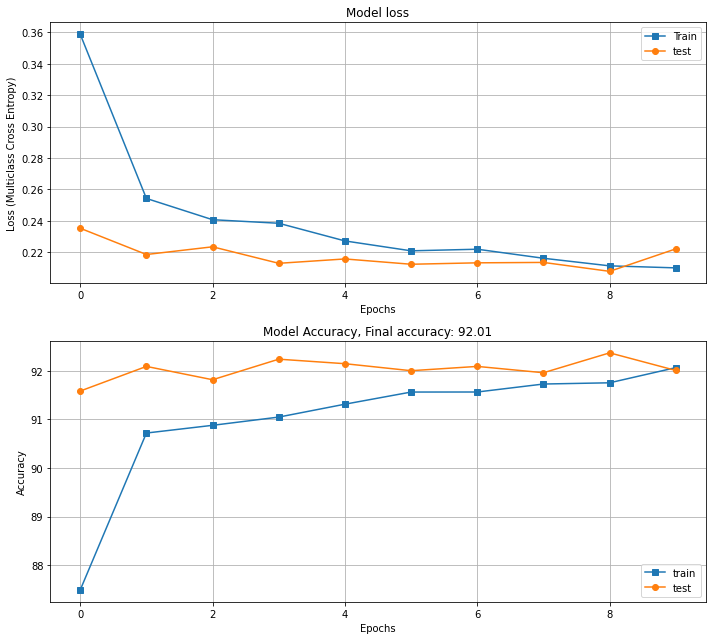

In [16]:
# display the accuracy of our model
fig, ax = plt.subplots(2, 1, figsize = (10, 9))

ax[0].plot(train_loss, "s-", label = "train", markerfacecolor='w')
ax[0].plot(test_loss, "o-", label = "test", markerfacecolor='w')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss (Multiclass Cross Entropy)")
ax[0].set_title("Model loss")
ax[0].legend()
ax[0].grid()

ax[1].plot(train_accuracy, "s-", label = "train", markerfacecolor='w')
ax[1].plot(test_accuracy, "o-", label = "test", markerfacecolor='w')
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")
ax[1].set_title(f"Model Accuracy, Final accuracy: {test_accuracy[-1]:.2f}")
ax[1].legend()
ax[1].grid()


plt.tight_layout()
plt.show()

In [ ]:
# what the vgg-16 model sees?
images, labels = next( iter( train_loader ) )

# send to GPU
images = images.to(device)
labels = labels.to(device)

In [181]:
# randomly generate a number between 0 and 255 to choose image
image_index = np.random.randint(0, batch_size)
print("random_number:", image_index)

# extract the 1st convolution layer
conv1 = vgg_network.features[0]
print(conv1)

# now extract the feature maps
feature_maps = conv1(images[image_index]).detach().cpu().numpy()
feature_maps.shape  # np.floor((224 + 2 * 1 - 3)/1) + 1 = 224, So, shape should be (64, 224, 224)
# 128 is batch_size

random_number: 60
Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


(64, 224, 224)

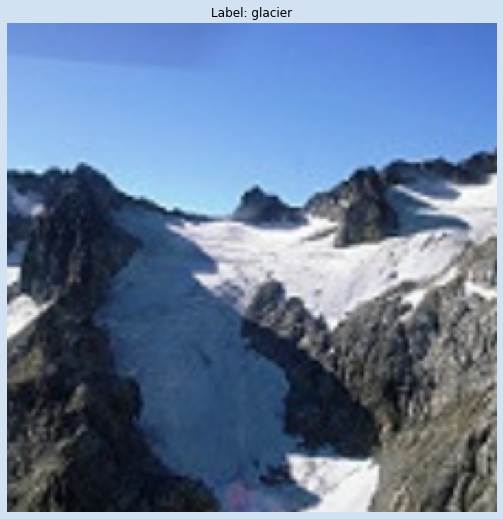

In [187]:
# convert the image to original form

image = images.data[image_index].detach().cpu().numpy().transpose((1, 2, 0))
mean  = np.array([0.485, 0.456, 0.406])
std   = np.array([0.229, 0.224, 0.225])
image = std * image + mean
image = np.clip(image, 0, 1)

# label of that image
label = train_set.classes[labels[image_index]]

# show that
plt.figure(figsize = (16, 9), facecolor='#D3E2F3')
plt.imshow(image)
plt.axis("off")
plt.title(f"Label: {label}")
plt.savefig(f"random_image.png", bbox_inches='tight')
plt.show()

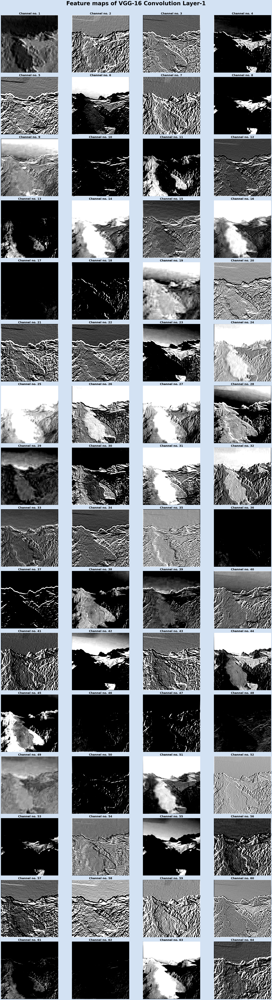

In [186]:
# now show the feature maps and also save the result
fig, axs = plt.subplots(16, 4, figsize = (30, 100), facecolor='#D3E2F3')

for (i, ax) in enumerate(axs.flatten()):
    ax.imshow(feature_maps[i], cmap='gray', vmin=0, vmax = np.max(image) * .9)
    ax.axis("off")
    ax.set_title(f"Channel no. {i + 1}", fontsize=20, fontweight = "bold")
    
plt.tight_layout()
plt.suptitle(f'Feature maps of VGG-16 Convolution Layer-1', x=.5, y=1.01, fontsize=40, fontweight="bold")
plt.savefig('vgg_16_feature_maps_conv1.png', dpi="figure", bbox_inches='tight')
plt.show()